[View in Colaboratory](https://colab.research.google.com/github/ujjwalsharma9/minor-proj/blob/master/faceDet_8att.ipynb)

In [18]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"ujjwalsharma72","key":"98a037e261e3febbb6f60b9c9070ae47"}'}

In [19]:
!pip install kaggle


In [20]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d jessicali9530/celeba-dataset

celeba-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [0]:
import zipfile
with zipfile.ZipFile("/content/celeba-dataset.zip","r") as zip_ref:
    zip_ref.extractall("/content")

In [0]:
with zipfile.ZipFile("/content/img_align_celeba.zip","r") as zip_ref:
    zip_ref.extractall("/content")

In [1]:
import pandas as pd  

data=pd.read_csv('/content/list_attr_celeba.csv')
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202599 entries, 0 to 202598
Data columns (total 41 columns):
image_id               202599 non-null object
5_o_Clock_Shadow       202599 non-null int64
Arched_Eyebrows        202599 non-null int64
Attractive             202599 non-null int64
Bags_Under_Eyes        202599 non-null int64
Bald                   202599 non-null int64
Bangs                  202599 non-null int64
Big_Lips               202599 non-null int64
Big_Nose               202599 non-null int64
Black_Hair             202599 non-null int64
Blond_Hair             202599 non-null int64
Blurry                 202599 non-null int64
Brown_Hair             202599 non-null int64
Bushy_Eyebrows         202599 non-null int64
Chubby                 202599 non-null int64
Double_Chin            202599 non-null int64
Eyeglasses             202599 non-null int64
Goatee                 202599 non-null int64
Gray_Hair              202599 non-null int64
Heavy_Makeup           202599 non

In [0]:
import glob
import numpy as np

import os.path as path
from scipy import misc

IMAGE_PATH = '/content/img_align_celeba'
file_paths = glob.glob(path.join(IMAGE_PATH, '00*.jpg'))

images = [misc.imread(path) for path in file_paths]
images = np.asarray(images)


In [3]:
image_size = np.asarray([images.shape[1], images.shape[2], images.shape[3]])
print(image_size)

[218 178   3]


In [4]:
images[1]

array([[[52, 11,  7],
        [54, 13,  9],
        [55, 16, 11],
        ...,
        [52, 15,  6],
        [43, 12,  7],
        [42, 11,  6]],

       [[52, 11,  7],
        [54, 13,  9],
        [55, 16, 11],
        ...,
        [53, 16,  7],
        [42, 13,  7],
        [42, 13,  7]],

       [[51, 12,  7],
        [53, 14,  9],
        [56, 17, 12],
        ...,
        [51, 17,  7],
        [44, 15,  9],
        [43, 14,  8]],

       ...,

       [[ 5,  5,  5],
        [ 4,  4,  4],
        [ 3,  3,  3],
        ...,
        [ 5,  0,  1],
        [10,  2,  0],
        [10,  2,  0]],

       [[10, 10, 10],
        [ 8,  8,  8],
        [ 7,  7,  7],
        ...,
        [ 4,  0,  1],
        [ 6,  1,  0],
        [ 6,  1,  0]],

       [[10, 10, 10],
        [ 8,  8,  8],
        [ 7,  7,  7],
        ...,
        [ 2,  0,  1],
        [ 5,  1,  0],
        [ 5,  1,  0]]], dtype=uint8)

In [0]:
col_list=['Bald','Black_Hair','Blond_Hair','Brown_Hair','Gray_Hair','Male','Straight_Hair','Wavy_Hair']

In [0]:
n_images = images.shape[0]
labels = []

for i in range(n_images):
    filename = path.basename(file_paths[i])
    index=int(filename.split(".")[0])
    label_list=[]
   
    for col in col_list:
      if data[col][index-1]==1:
        label_list.append(col)
    labels.append(label_list)

In [7]:
from sklearn.preprocessing import MultiLabelBinarizer
labels = np.array(labels)
labels

array([list([]), list(['Black_Hair', 'Male']),
       list(['Male', 'Straight_Hair']), ..., list(['Brown_Hair']),
       list(['Blond_Hair', 'Wavy_Hair']),
       list(['Brown_Hair', 'Wavy_Hair'])], dtype=object)

In [8]:
mlb = MultiLabelBinarizer()
labels = mlb.fit_transform(labels)
 
# loop over each of the possible class labels and show them
for (i, label) in enumerate(mlb.classes_):
	print("{}. {}".format(i + 1, label))

1. Bald
2. Black_Hair
3. Blond_Hair
4. Brown_Hair
5. Gray_Hair
6. Male
7. Straight_Hair
8. Wavy_Hair


In [9]:
labels

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 1, 1, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1]])

In [0]:

face_test=images[:2000]
label_test=labels[:2000]

image_train=images[2000:]
label_train=labels[2000:]

In [0]:
# import matplotlib.pyplot as plt

# plt.imshow(face_test[0])
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
# plt.show()

In [0]:
from google.colab import files
files.upload()

In [0]:
# import cv2                                         
# import sys 
# img=face_test[0];
# gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# haar_face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_alt.xml')
# faces = haar_face_cascade.detectMultiScale(gray_img, scaleFactor=1.1, minNeighbors=5);
# print('Faces found: ', len(faces))


In [0]:
# plt.imshow(face_test[0])
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
# plt.show()

In [14]:
face_test.dtype

dtype('uint8')

In [15]:
face_test.shape[0]

2000

In [0]:
import cv2
import sys

def faceDetect(image):
  img=image;
  gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  haar_face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_alt.xml')
  faces = haar_face_cascade.detectMultiScale(gray_img, scaleFactor=1.1, minNeighbors=5)
  return faces
  

In [0]:
face_test_list=[]
test_image_list=[]
test_label_list=[]
for i in range(face_test.shape[0]):
  faces=faceDetect(face_test[i])
  if len(faces)>=1 :
    face_test_list.append(faces)
    test_image_list.append(face_test[i])
    test_label_list.append(label_test[i])
  
  

In [13]:
label_test.dtype

dtype('int64')

In [13]:
face_test=np.asarray(test_image_list,dtype='uint8')
face_test.shape

(1879, 218, 178, 3)

In [14]:
label_test=np.asarray(test_label_list,dtype='int64')
label_test.shape

(1879, 8)

In [0]:
X_train=image_train/255
y_train=label_train

X_test=face_test/255
y_test=label_test

In [16]:
from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation
from keras.layers.core import Flatten
from keras.layers.core import Dropout
from keras.layers.core import Dense
from keras import backend as K
from keras.optimizers import SGD

model = Sequential()
model.add(Conv2D(filters=16, kernel_size=2, padding='same', activation='relu', 
                        input_shape=(218, 178, 3)))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.3))
model.add(Flatten())
model.add(Dense(500, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(y_train.shape[1], activation='sigmoid'))

sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(loss='binary_crossentropy',
              optimizer=sgd)
model.summary()
model.fit(X_train, y_train, epochs=40, batch_size=200)

preds = model.predict(X_test)


Using TensorFlow backend.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 218, 178, 16)      208       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 109, 89, 16)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 109, 89, 32)       2080      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 54, 44, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 54, 44, 64)        8256      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 27, 22, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 27, 22, 64)        0         
__________

In [17]:
preds

array([[3.4743730e-02, 5.2591909e-02, 3.5845041e-01, ..., 2.5015095e-01,
        2.3674563e-01, 1.3922787e-01],
       [1.3631488e-03, 4.3236536e-01, 9.5971618e-03, ..., 4.8056895e-01,
        2.3374282e-01, 2.9140437e-01],
       [1.7651998e-03, 2.3542759e-01, 1.6911892e-02, ..., 6.9384533e-01,
        3.5236079e-01, 4.7511846e-02],
       ...,
       [2.7290346e-02, 1.6843742e-01, 9.9720150e-02, ..., 4.2654938e-01,
        2.8945804e-01, 1.2054647e-01],
       [5.7620320e-05, 3.5118185e-02, 4.5624655e-03, ..., 1.3705877e-03,
        8.9582622e-02, 8.5967207e-01],
       [2.6000882e-03, 4.3617588e-01, 6.9210264e-03, ..., 3.8190016e-01,
        2.3012181e-01, 4.4454375e-01]], dtype=float32)

In [18]:
percent=preds*100
percent

array([[3.47437310e+00, 5.25919104e+00, 3.58450394e+01, ...,
        2.50150948e+01, 2.36745625e+01, 1.39227867e+01],
       [1.36314884e-01, 4.32365341e+01, 9.59716201e-01, ...,
        4.80568962e+01, 2.33742809e+01, 2.91404362e+01],
       [1.76519975e-01, 2.35427589e+01, 1.69118917e+00, ...,
        6.93845367e+01, 3.52360802e+01, 4.75118446e+00],
       ...,
       [2.72903466e+00, 1.68437424e+01, 9.97201538e+00, ...,
        4.26549377e+01, 2.89458046e+01, 1.20546465e+01],
       [5.76203223e-03, 3.51181841e+00, 4.56246555e-01, ...,
        1.37058780e-01, 8.95826244e+00, 8.59672089e+01],
       [2.60008812e-01, 4.36175880e+01, 6.92102611e-01, ...,
        3.81900177e+01, 2.30121803e+01, 4.44543762e+01]], dtype=float32)

In [0]:
preds=np.round(preds, 2)
preds[preds>=0.5] = 1
preds[preds<0.5] = 0

In [20]:
score=np.sum(preds==y_test)/(preds==y_test).size
score

0.8775944651410325

In [0]:
train_labels=[]
for i in range(y_train.shape[0]):
  label_list=[]
  for j in range(y_train.shape[1]):
    if y_train[i][j]==1:
      label_list.append(col_list[j])
  train_labels.append(label_list)


pred_labels=[]
for i in range(preds.shape[0]):
  label_list=[]
  for j in range(preds.shape[1]):
    if preds[i][j]==1:
      label_list.append(col_list[j])
  pred_labels.append(label_list)
act_labels=[]
for i in range(y_test.shape[0]):
  label_list=[]
  for j in range(y_test.shape[1]):
    if y_test[i][j]==1:
      label_list.append(col_list[j])
  act_labels.append(label_list)

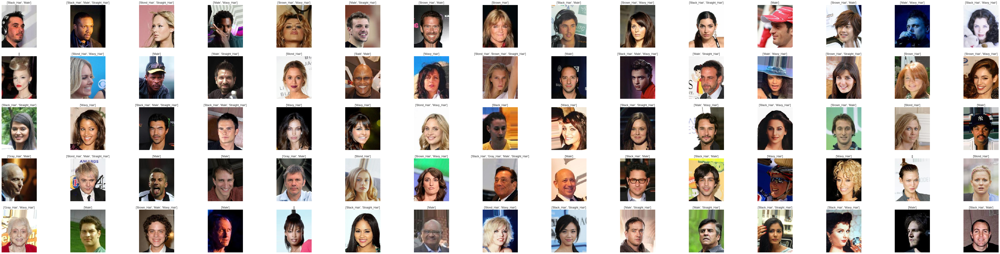

In [28]:
import  numpy as  np
import  matplotlib.pyplot  as plt
%matplotlib inline

fig = plt.figure(figsize=(80,20))
for i in range(75):
    
   
      ax = fig.add_subplot(5,15 , i + 1, xticks=[], yticks=[])
      ax.imshow(np.squeeze(X_train[i]))
      ax.set_title(train_labels[i])

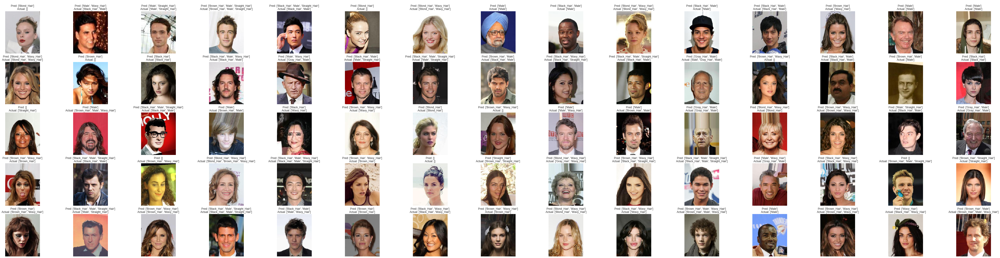

In [43]:
fig = plt.figure(figsize=(80,20))            
for i in range(75):
      
      ax = fig.add_subplot(5,15 , i + 1, xticks=[], yticks=[])
      ax.imshow(X_test[i])
      ax.set_title("\nPred: {}\nActual: {}".format(pred_labels[i], act_labels[i]))

In [0]:
# np.pad(face_test[0], ((0,0), (1,1), (1,1)), mode='constant')

In [0]:
# plt.imshow(face_test[0])
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
# plt.show()

In [0]:
# img = np.zeros([218,178,3],dtype=np.uint8)
# img.fill(255)
# plt.imshow(img)
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
# plt.show()

In [0]:
# face_test[0].shape

In [0]:
# img_merge = np.hstack( (face_test[0],img) )

In [0]:
# plt.imshow(img_merge)
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
# plt.show()

In [0]:
#img_merge.shape

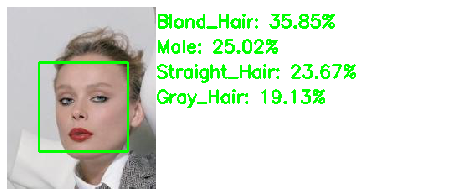

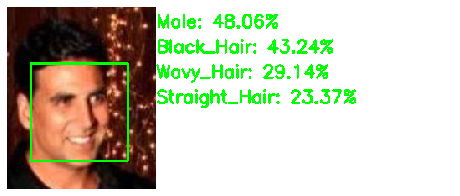

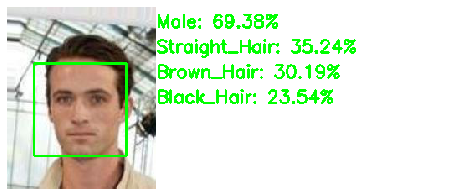

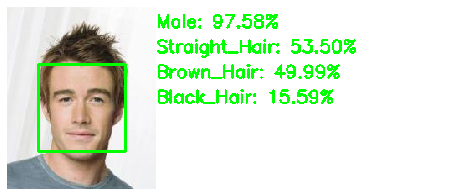

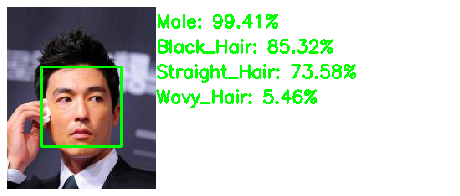

...

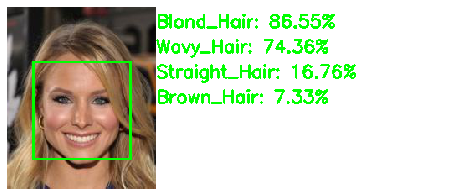

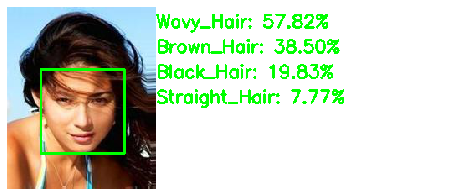

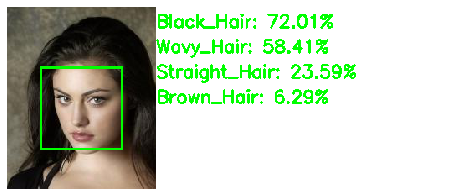

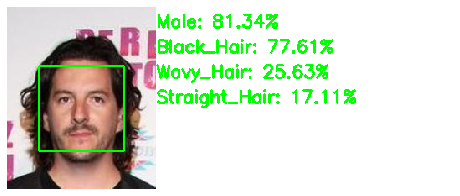

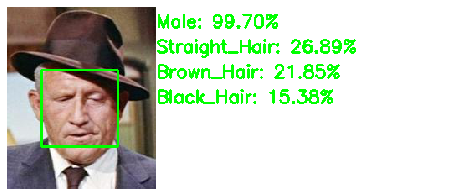

In [21]:
#for 20 images
import  matplotlib.pyplot  as plt
            
for i in range(20):
  for (x, y, w, h) in face_test_list[i]:
    cv2.rectangle(face_test[i], (x, y), (x+w, y+h), (0, 255, 0), 2)
  img = np.zeros([218,356,3],dtype=np.uint8)
  img.fill(255)
  img_merge = np.hstack( (face_test[i],img) )
  idxs = np.argsort(percent[i])[::-1][:4]
  for (k, j) in enumerate(idxs):
	# build the label and draw the label on the image
	  lab = "{}: {:.2f}%".format(mlb.classes_[j], percent[i][j])
	  cv2.putText(img_merge, lab, (178, (k * 30) + 25), 
		  cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
  
  plt.imshow(img_merge)
  plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
  plt.show()
  print("\n\n")
  

  


In [0]:
# fig = plt.figure(figsize=(218,178))            
# for i in range(50):
      
#       ax = fig.add_subplot(25,2 , i + 1, xticks=[], yticks=[])
#       ax.imshow(X_test[i])
#       //ax.set_title("\nPred: {}\nActual: {}".format(pred_labels[i], act_labels[i]))

In [0]:
# print(percent[1][5],percent[1][1])

In [0]:
# mlb.classes_[5]

In [0]:
# img = np.zeros([218,178,3],dtype=np.uint8)
# img.fill(255)
# img_merge = np.hstack( (face_test[1],img) )
# plt.imshow(img_merge)
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
# plt.show()

In [0]:
# idxs = np.argsort(percent[i])[::-1][:4]

In [0]:
# for (i, j) in enumerate(idxs):
# 	# build the label and draw the label on the image
# 	lab = "{}: {:.2f}%".format(mlb.classes_[j], percent[1][j])
# 	cv2.putText(img_merge, lab, (178, (i * 30) + 25), 
# 		cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
# plt.imshow(img_merge)
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
# plt.show()

In [0]:
# img_merge.shape